<a href="https://colab.research.google.com/github/xEvheMary/MI-BCI-UnityKart/blob/main/ColabScripts/Analysis_Type2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
%matplotlib inline

In [ ]:
!pip install mne &> /dev/null
!pip install mne-icalabel &> /dev/null

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import mne
import matplotlib.pyplot as plt
import math
from scipy.io import loadmat
import pandas as pd
import pickle
import gc

In [ ]:
from mne.preprocessing import ICA
from mne_icalabel import label_components
from sklearn.base import BaseEstimator, TransformerMixin

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.pipeline import Pipeline
from mne.decoding import Scaler
from mne.decoding import CSP

In [ ]:
mne.set_log_level(False)

# Subject

In [ ]:
sbj_n = 1 #@param {type:"integer"}
sbj_path = 'Subject ' + str(sbj_n)

# Dataset

In [ ]:
base_path = '/content/drive/MyDrive/Th/EEG Recording'
subj_folder = os.path.join(base_path, sbj_path)
l = [file for file in os.listdir(subj_folder) if file.endswith('gdf')]

In [ ]:
type_1 = [file for file in os.listdir(subj_folder) if file.endswith('1.gdf')]
type_2 = [file for file in os.listdir(subj_folder) if file.endswith('2.gdf')]
smaller = min(len(type_1), len(type_2))
type_1 = type_1[:smaller]
type_2 = type_2[:smaller]

# Constants

In [ ]:
# Constants
ch_list = ['Fp1', 'Fp2', 'AF3', 'AF4', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz','FC4', 'FT8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2']
# For epoching
st = 0
# For sub-epochs
sub_dur = 2
stride = 0.25
# For cross-validation dataset
n_splits = 4
#picked_chn = ['FT7','FC3','FCz','FC4','FT8','T7','C3','Cz','C4','T8','TP7','CP3','CPz','CP4','TP8']
picked_chn = ['Fz','FC3','FCz','FC4','T7','C3','Cz','C4','T8','CP3','CPz','CP4','Pz',]

# Functions

### Sub-Functions

In [ ]:
def load_ds(pt, f):       # For BCIC Dataset
  fp = os.path.join(pt, f)
  print("File path: {}".format(fp))
  if fp.endswith('gdf'):
    raw_data = mne.io.read_raw_gdf(fp, preload=True)
  else:
    raw_data = None
  return raw_data

def select_event(events_from_annot, event_dict, sfreq):
  # specify needed event
  l_ev = event_dict['769']
  r_ev = event_dict['770']
  x_ev = event_dict['33024']
  end_trial = event_dict['800']
  needed_event = [l_ev, r_ev, x_ev, end_trial]
  # Remove unecessary last part
  re = events_from_annot[::-1, 2].tolist()  # reverse
  last_id = re.index(end_trial)             # Find index of last end signal
  if last_id > 0:                           # Filter out last part
    events_annot = events_from_annot[:-last_id]
  else:
    events_annot = events_from_annot[:]
  # Filter put other event except the one used
  mask = np.isin(events_annot[:, 2], needed_event)
  filtered_events = events_annot[mask]
  # Get durations
  a = np.diff(filtered_events[:, 0])/sfreq
  dur = round(np.mean(a[::2]),2)
  print('Average duration of this session trials : ',dur)
  return needed_event, dur

### Data Functions

In [ ]:
def load_all_data(type_dd, alpha=False, use_ica=True, pick=None):
  combined_base = []
  combined_left = []
  combined_right = []
  combined_foot = []
  lap_cropped = []
  for data in type_dd:
    x = load_ds(subj_folder, data)    # Load data
    channel_mapping = {old_name: new_name for old_name, new_name in zip(x.ch_names, ch_list)}   # Remap channels
    x.rename_channels(channel_mapping)
    montage = mne.channels.make_standard_montage('standard_1020')
    _ = x.set_montage(montage)
    # Channel Select
    if pick:
      x.pick_channels(pick, ordered=True)
    # Event select
    events_from_annot, event_dict = mne.events_from_annotations(x)
    needed_event, dur = select_event(events_from_annot, event_dict, x.info['sfreq'])
    x.filter(l_freq=2, h_freq=40)       # Filter
    x = x.set_eeg_reference("average")  # Average Reference
    if use_ica:
      x = custom_ica.transform(x)
    # Laps
    filtered_events = [event for event in events_from_annot if event[2] in needed_event]
    pairs = [(i, i+7) for i in range(0, len(filtered_events) - 7, 8)]
    for start_index, end_index in pairs:
      # Set tmin and tmax based on the indices
      start_ev = filtered_events[start_index][0]
      end_ev = filtered_events[end_index][0]
      tmin = x.times[start_ev]
      tmax = x.times[end_ev]
      raw_crop = x.copy().crop(tmin=tmin, tmax=tmax)
      lap_cropped.append(raw_crop)
    # Alpha-band
    if alpha:
      x.filter(l_freq=7, h_freq=13)
    # Load data into epochs
    epoch_base = x.copy().crop(tmin=10-dur, tmax=10)
    epoch_l = mne.Epochs(x, events_from_annot, event_id=needed_event[0], tmin=st-1, tmax=st+dur, baseline=None, preload=True)
    epoch_r = mne.Epochs(x, events_from_annot, event_id=needed_event[1], tmin=st-1, tmax=st+dur, baseline=None, preload=True)
    epoch_x = mne.Epochs(x, events_from_annot, event_id=needed_event[2], tmin=st-1, tmax=st+dur, baseline=None, preload=True)
    if len(epoch_x) > (len(epoch_l)+len(epoch_r)):
      epoch_x.drop([-1])    # Remove last epoch since it's after the end
    # Append
    combined_base.append(epoch_base)
    combined_left.append(epoch_l)
    combined_right.append(epoch_r)
    combined_foot.append(epoch_x)
  return lap_cropped, combined_base, combined_left, combined_right, combined_foot

In [ ]:
def base_ep(combined_base: list, plot=True):
  all_base = mne.concatenate_raws(combined_base)
  sfq = all_base.info['sfreq']
  samples_per_epoch = int(sub_dur * sfq)
  samples_per_stride = int(stride * sfq)
  base_data = all_base.get_data()
  epochs_data = []
  for start in range(0, base_data.shape[1] - samples_per_epoch + 1, samples_per_stride):
      epoch_data = base_data[:, start:start + samples_per_epoch]
      epochs_data.append(epoch_data)
  epochs_data = np.array(epochs_data)
  n_epochs, _, n_channels = epochs_data.shape
  times = np.arange(0, sub_dur, 1 / sfq)
  epochs_base = mne.EpochsArray(epochs_data, info=all_base.info, tmin=0, verbose=True)
  spectrum_b = epochs_base.compute_psd(fmin=2, fmax=50)
  #spectrum_b_picked = spectrum_b.pick(['FC3','CP3','T7','C3','FCz','Cz','CPz','C4','T8','FC4','CP4'])
  spectrum_b_picked = spectrum_b
  if (plot == True):
    _ = spectrum_b_picked.plot()
    #_ = spectrum_b.plot()
  return epochs_base, spectrum_b_picked

In [ ]:
def feat_analysis(eps, tfr):
  fig, axes = plt.subplots(4, 3, figsize=(14, 14), sharey='row')
  #signal = eps.average(picks=['C3','Cz','C4']).get_data()
  picked = ['C3','Cz','C4']
  for ch, ax in enumerate(axes[0,:]):
    eps.average().plot(
              [picked[ch]],
              axes=ax,
              show=False
          )
  filtered = eps.filter(7,13)
  for ch, ax in enumerate(axes[1,:]):
    filtered.average().plot(
              [picked[ch]],
              axes=ax,
              show=False
          )
  tfr = mne.time_frequency.tfr_multitaper(eps, freqs=freqs, picks=picked ,n_cycles=2, return_itc=False, average=False).average()
  alpha_band = (8, 12)
  freq_indices = np.where((freqs >= alpha_band[0]) & (freqs <= alpha_band[1]))[0]
  energy_band = np.mean(np.abs(tfr.data[:, freq_indices, :])**2, axis=1)  # Average across frequencies
  for ch, ax in enumerate(axes[2,:]):
    ax.plot(tfr.times, energy_band[ch])
  return filtered

In [ ]:
def plot_multi(data, info, col, row, title='Plot'):
  # Data has to be array
  fig, axes = plt.subplots(row, col, figsize=(15, 8))
  for ep_id, ax in enumerate(axes.flat[:]):
    mne.viz.plot_topomap(data[ep_id], info, axes=ax, show=False)
    ax.set_title(f'Epoch {ep_id + 1}')
  fig.suptitle(title)
  fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
  cax = plt.axes((0.9, 0.13, 0.02, 0.76))
  fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

### ICA Function

In [ ]:
def load_dataset(file_list: list, pick=None):
  combined_set = []
  for data in file_list:
    x = load_ds(subj_folder, data)    # Load data
    combined_set.append(x)
  raw_cat = mne.concatenate_raws(combined_set)
  channel_mapping = {old_name: new_name for old_name, new_name in zip(raw_cat.ch_names, ch_list)}   # Remap channels
  raw_cat.rename_channels(channel_mapping)
  montage = mne.channels.make_standard_montage('standard_1020')
  _ = raw_cat.set_montage(montage)
  if pick:
    raw_cat.pick_channels(pick, ordered=True)
  events_from_annot, event_dict = mne.events_from_annotations(raw_cat)
  needed_event, dur = select_event(events_from_annot, event_dict, raw_cat.info['sfreq'])
  return raw_cat, needed_event, dur, events_from_annot

In [ ]:
class CustomICA(BaseEstimator, TransformerMixin):
    def __init__(self, n_components=20, components_to_remove=None, ica_params=None):
        self.n_components = n_components
        self.components_to_remove = components_to_remove
        self.ica_params = ica_params
        self.ica = ICA(**ica_params) if ica_params else ICA(n_components=n_components, max_iter="auto", method="infomax", fit_params=dict(extended=True))

    def fit(self, X, y=None):
        X.load_data()
        X.filter(l_freq=1, h_freq=100)
        X = X.set_eeg_reference("average")
        self.ica.fit(X)
        ic_labels = label_components(x, self.ica, method="iclabel")
        labels = ic_labels["labels"]
        exclude_idx = [idx for idx, label in enumerate(labels) if label not in ["brain", "other"]]
        self.ica.exclude = exclude_idx
        return self

    def transform(self, X):
        return self.ica.apply(X)

    def fit_transform(self, X, y=None):
        self.fit(X, y)
        return self.transform(X)

    def save(self, filename):
        with open(filename, 'wb') as file:
            pickle.dump(self, file)

    @classmethod
    def load(cls, filename):
        with open(filename, 'rb') as file:
            return pickle.load(file)

# Preprocess

## ICA

In [ ]:
# Load dataset, combined into one raw
x, needed_event, dur, events_from_annot = load_dataset([type_1[0]] + [type_2[0]] + [type_1[-1]] + [type_2[-1]], pick=None)

File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S1_1.gdf
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S2_2.gdf
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S7_1.gdf
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S8_2.gdf
Average duration of this session trials :  4.71


In [ ]:
# ICA Object
custom_ica = CustomICA(n_components=10)

In [ ]:
custom_ica.fit(x)

CustomICA(n_components=10)

## Montage

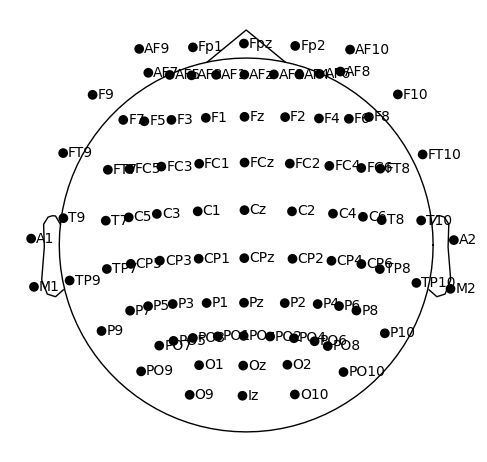

In [ ]:
# Create a standard montage (e.g., 10-20 system)
montage = mne.channels.make_standard_montage('standard_1020')

# Plot the montage to visualize the electrode positions
fig, ax = plt.subplots(figsize=(6, 6))
_ = montage.plot(show_names=True, axes=ax)

## Type 1 Data

In [ ]:
type_dd = type_2 # @param ["type_1", "type_2"] {type:"raw"}
print(type_dd)

['record-[2024.01.21]_S2_2.gdf', 'record-[2024.01.21]_S4_2.gdf', 'record-[2024.01.21]_S6_2.gdf', 'record-[2024.01.21]_S8_2.gdf']


In [ ]:
combined_lap, combined_base, combined_left, combined_right, combined_foot = load_all_data(type_dd, alpha=False, use_ica=True, pick=None)

File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S2_2.gdf
Average duration of this session trials :  6.28
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S4_2.gdf
Average duration of this session trials :  6.27
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S6_2.gdf
Average duration of this session trials :  6.27
File path: /content/drive/MyDrive/Th/EEG Recording/Subject 1/record-[2024.01.21]_S8_2.gdf
Average duration of this session trials :  6.28


### Baseline

#### Spectrum

Not setting metadata
93 matching events found
No baseline correction applied
0 projection items activated


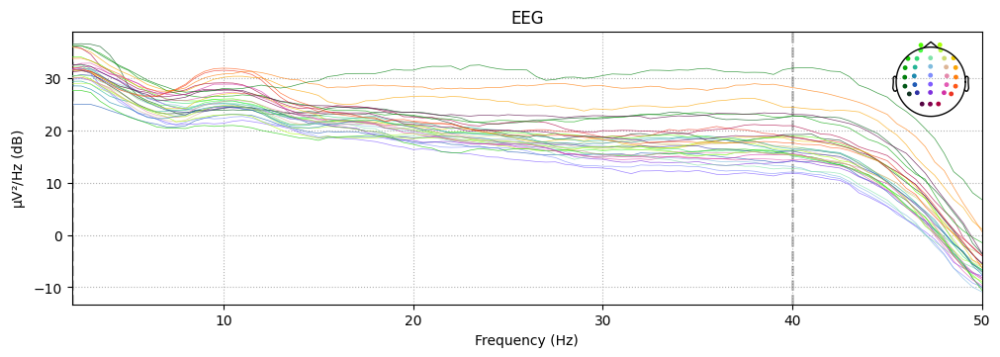

In [ ]:
base_eps, spec_base = base_ep(combined_base)

#### TFR

In [ ]:
freqs = np.arange(4, 40)  # frequencies from 2-35Hz
base_tfr = mne.time_frequency.tfr_multitaper(
    base_eps,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)

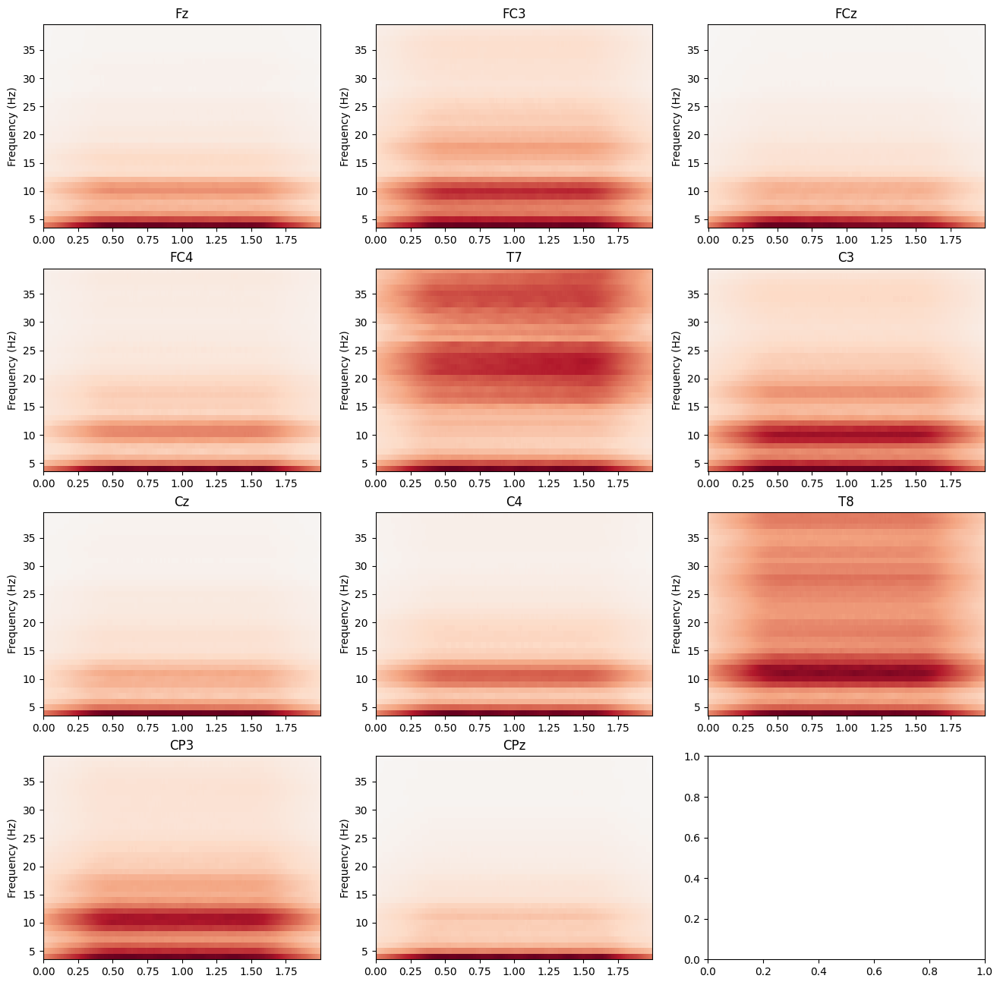

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(16, 16))
sfq = base_eps.info['sfreq']

for ch, ax in enumerate(axes.flat[:-1]):
  base_tfr.average().plot(
            [picked_chn[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked_chn[ch])
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')

#### Topo

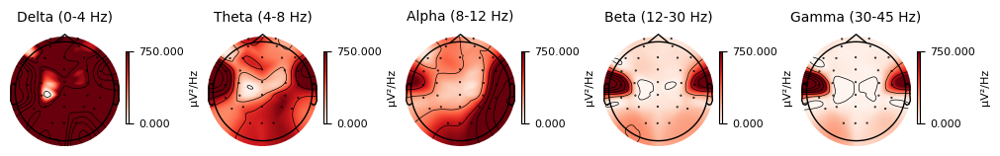

In [ ]:
_ = base_eps.compute_psd().plot_topomap(vlim=(0, 750))

#### Overall

##### Signal

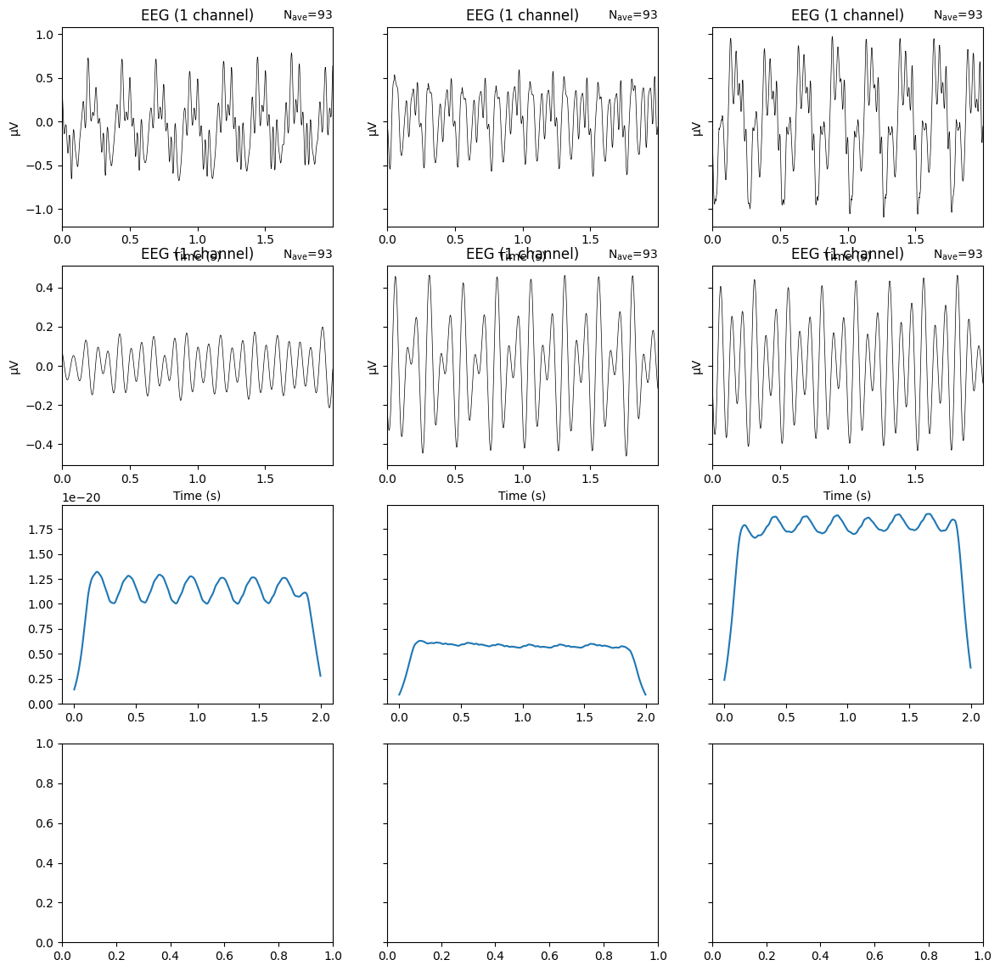

In [ ]:
base_filt_data = feat_analysis(base_eps, base_tfr)

##### MAV (Mean Absolute Value)

In [ ]:
base_mav_data = np.abs(base_filt_data.get_data()).mean(axis=2)

<ipython-input-130-a4b5f5954362>:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  base_mav_data = np.abs(base_filt_data.get_data()).mean(axis=2)


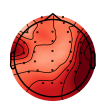

In [ ]:
_ = mne.viz.plot_topomap(base_mav_data.mean(axis=0), base_eps.info, show=True)

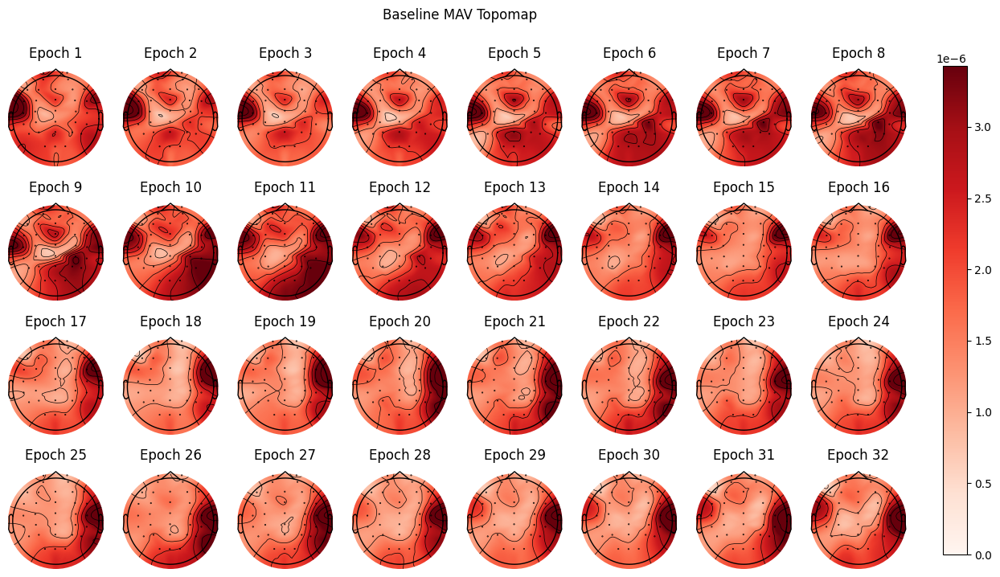

In [ ]:
vert = min((base_mav_data.shape[0] // 8, 4))
plot_multi(base_mav_data, base_eps.info, 8, vert, 'Baseline MAV Topomap')

### Laps

#### Data

In [ ]:
lap_list = []
ends = [raw.times[-1] for raw in combined_lap]
for raw in combined_lap:
    events, _ = mne.events_from_annotations(raw)  # Extract events from the raw data
    #tmax = raw.times[-1]  # Set tmax to the last time point of the raw data
    epochs = mne.Epochs(raw, events=events, tmin=0, tmax=min(ends), baseline=None, detrend=1, preload=True)
    lap_list.append(epochs)
event_line, event_name = mne.events_from_annotations(combined_lap[0])
event_line[:, 0] -= event_line[0, 0]

In [ ]:
lap_eps = mne.concatenate_epochs(lap_list)

<ipython-input-134-7f16e6bb35db>:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  lap_eps = mne.concatenate_epochs(lap_list)


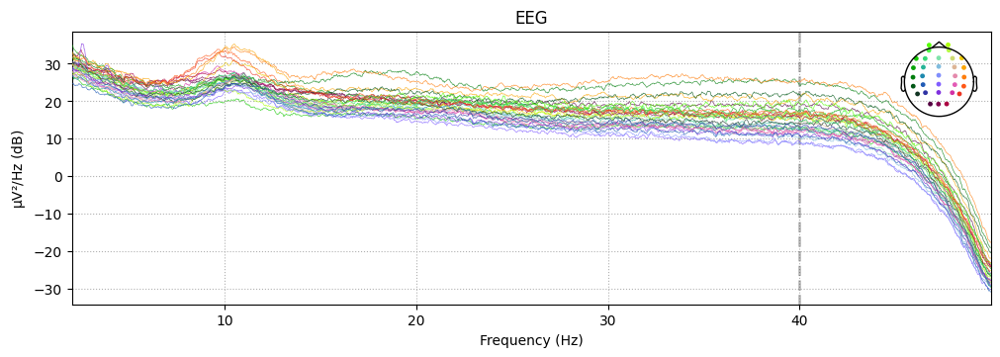

In [ ]:
spectrum_laps = lap_eps.compute_psd(fmin=2, fmax=50)
_ = spectrum_laps.plot()

#### TFR

In [ ]:
freqs = np.arange(4, 40)  # frequencies from 2-35Hz
tfr = mne.time_frequency.tfr_multitaper(
    lap_eps,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)

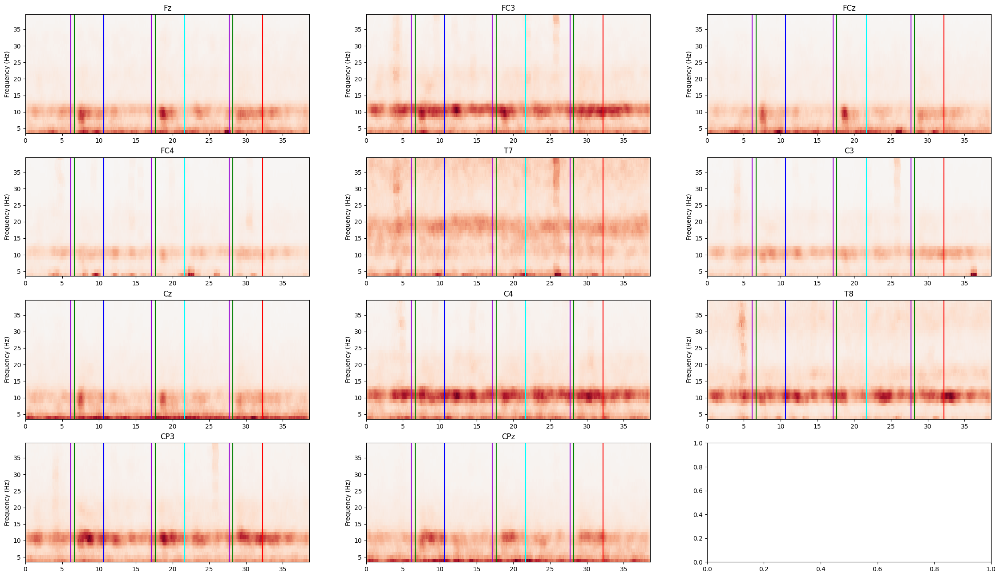

In [ ]:
sfq = lap_eps.info['sfreq']
color_code = ['cyan','g','b','r','darkviolet']
len2wid = np.floor((tfr.times[-1] - tfr.times[0])*0.75)
fig, axes = plt.subplots(4, 3, figsize=(len2wid, 16))

for ch, ax in enumerate(axes.flat[:-1]):
  tfr.average().plot(
            [picked_chn[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked_chn[ch])
  for event in event_line:
    event_pos = event[0] / sfq  # Convert sample position to seconds
    ax.axvline(x=event_pos, color=color_code[event[2]-1])
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')

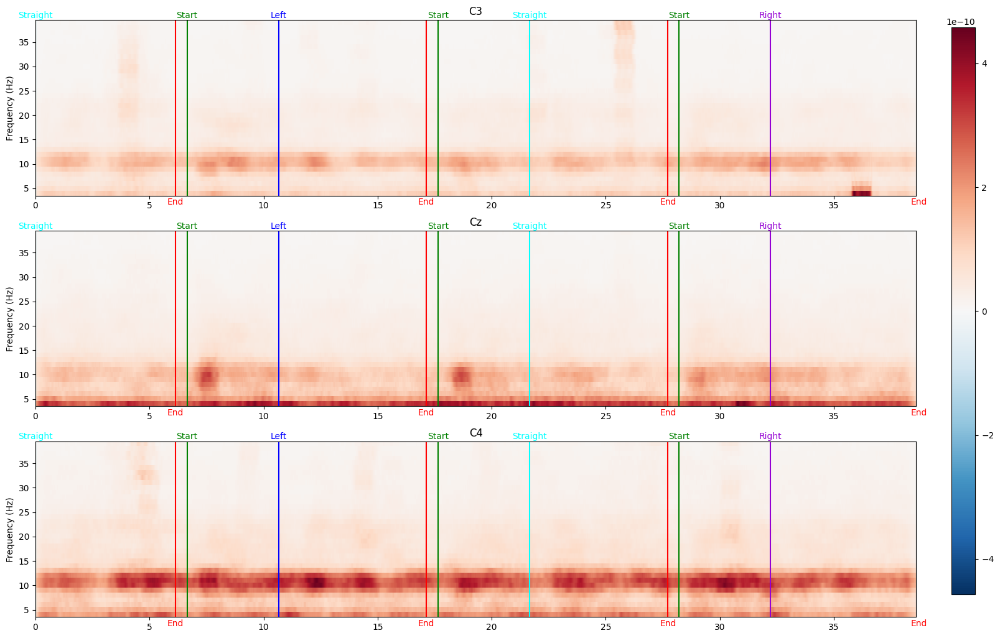

In [ ]:
sfq = lap_eps.info['sfreq']
color_code = ['cyan','g','b','darkviolet','r']
event_code = ['Straight', 'Start','Left', 'Right', 'End']
len2wid = np.floor((tfr.times[-1] - tfr.times[0])*0.5)
fig, axes = plt.subplots(3, 1, figsize=(len2wid, 12))

picked = ['C3','Cz','C4']
for ch, ax in enumerate(axes.flat[:]):
  tfr.average().plot(
            [picked[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked[ch])
  for event in event_line:
    event_pos = event[0] / sfq  # Convert sample position to seconds
    used_color = color_code[event[2]-1]
    ax.axvline(x=event_pos, color=used_color)
    if used_color == 'r':
      plt.text(event_pos/tfr.times[-1], -0.061, event_code[event[2]-1], ha='center', va='bottom', color=used_color, transform=ax.transAxes)
    else:
      plt.text(event_pos/tfr.times[-1], 1.002, event_code[event[2]-1], ha='center', va='bottom', color=used_color, transform=ax.transAxes)
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

#### Topo

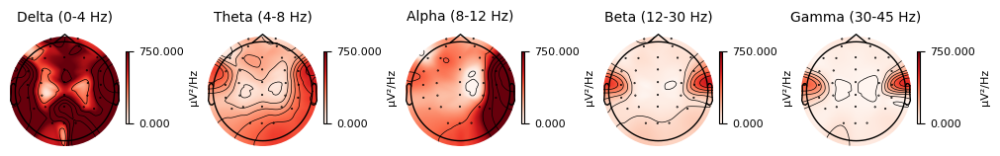

In [ ]:
_ = lap_eps.compute_psd().plot_topomap(vlim=(0, 750))

#### Overall

###### Signal

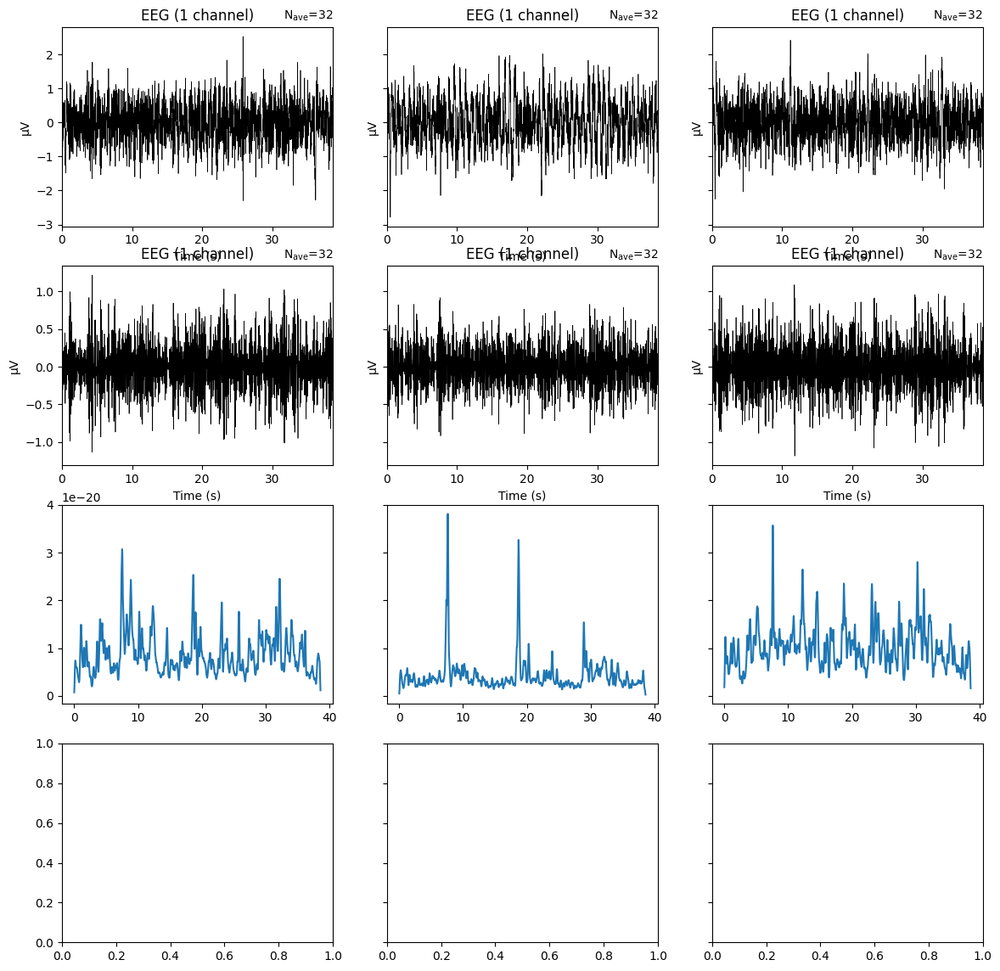

In [ ]:
lap_filt_data = feat_analysis(lap_eps, tfr)

###### MAV (Mean Absolute Value)

In [ ]:
lap_mav_data = np.abs(lap_filt_data.get_data()).mean(axis=2)

<ipython-input-141-dae4ea1dcb2c>:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  lap_mav_data = np.abs(lap_filt_data.get_data()).mean(axis=2)


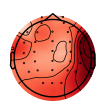

In [ ]:
_ = mne.viz.plot_topomap(lap_mav_data.mean(axis=0), lap_eps.info, show=True)

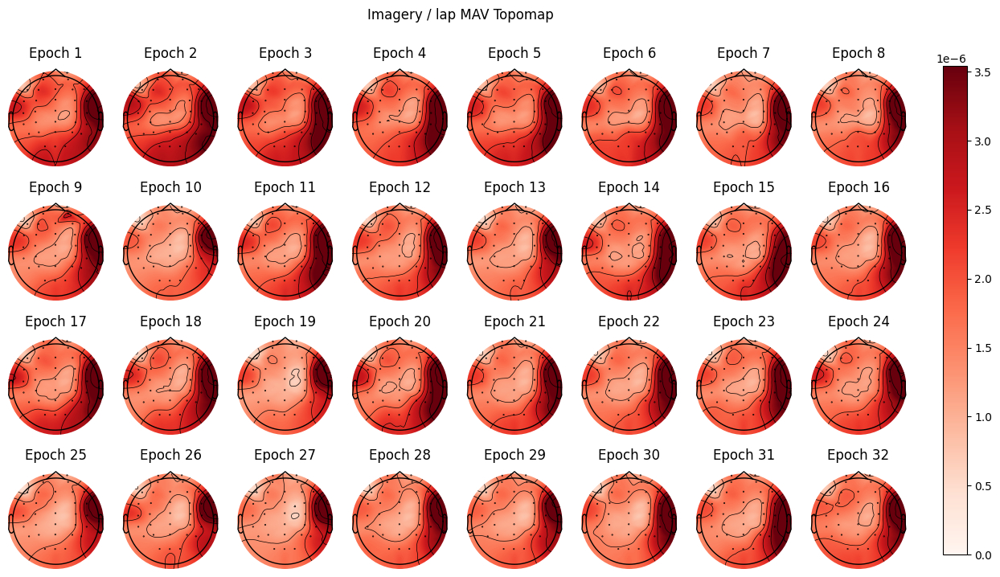

In [ ]:
vert = min((lap_mav_data.shape[0] // 8, 4))
plot_multi(lap_mav_data, lap_eps.info, 8, vert, 'Imagery / lap MAV Topomap')

### Trials

#### Left

In [ ]:
left_data = [x.get_data(copy=True) for x  in combined_left]
min_left_len = min([x.shape[-1] for x in left_data])
new_left_data = [a[:,:,:min_left_len] for a in left_data]
left_arr = np.concatenate(new_left_data, axis=0)

In [ ]:
left_eps =  mne.EpochsArray(left_arr, info=combined_left[0].info, tmin=-1, verbose=True)

Not setting metadata
32 matching events found
No baseline correction applied
0 projection items activated


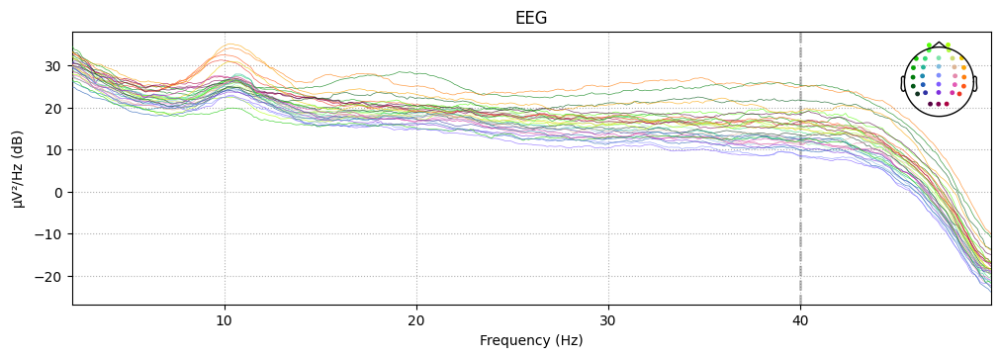

In [ ]:
spectrum_l = left_eps.compute_psd(fmin=2, fmax=50)
_ = spectrum_l.plot()

##### Image

In [ ]:
#_ = left_eps.plot_image(picks=['C3','Cz','C4'])

##### TFR

In [ ]:
freqs = np.arange(4, 40)  # frequencies from 2-35Hz
left_tfr = mne.time_frequency.tfr_multitaper(
    left_eps,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)

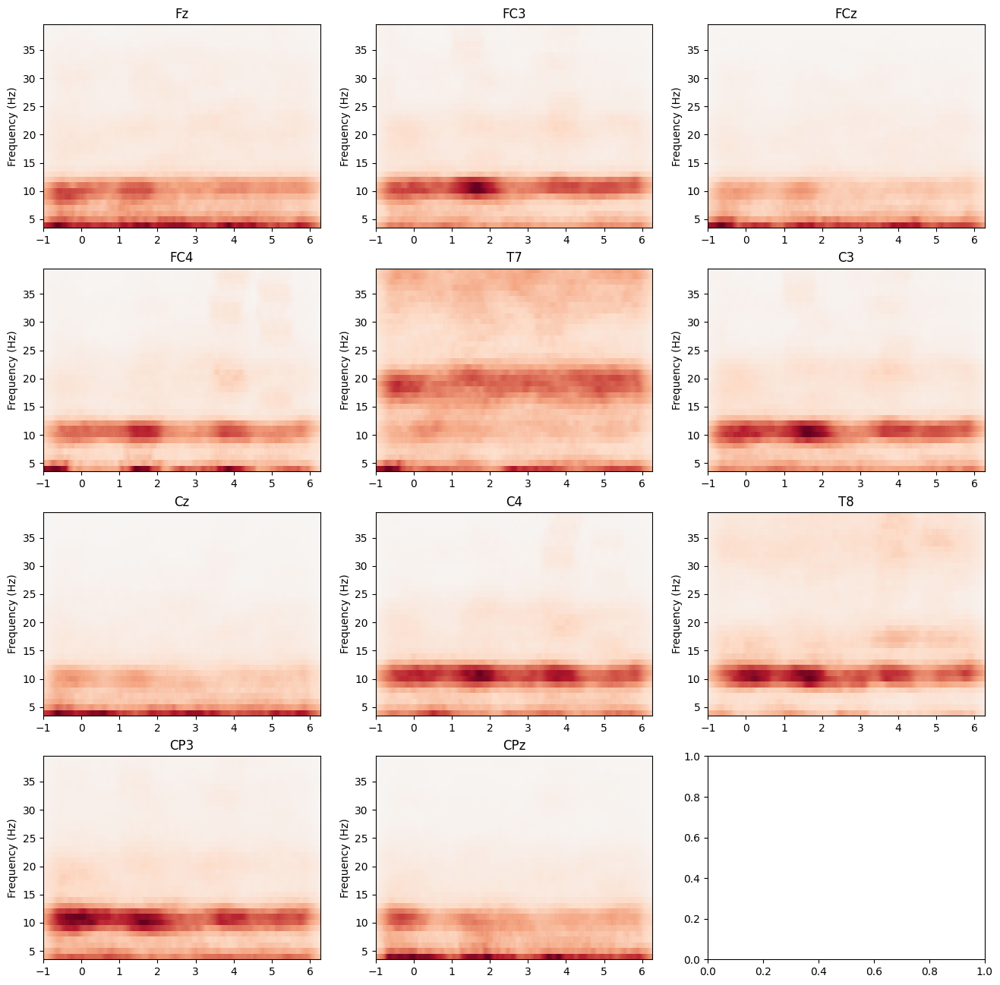

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(16, 16))
sfq = left_eps.info['sfreq']

for ch, ax in enumerate(axes.flat[:-1]):
  left_tfr.average().plot(
            [picked_chn[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked_chn[ch])
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')

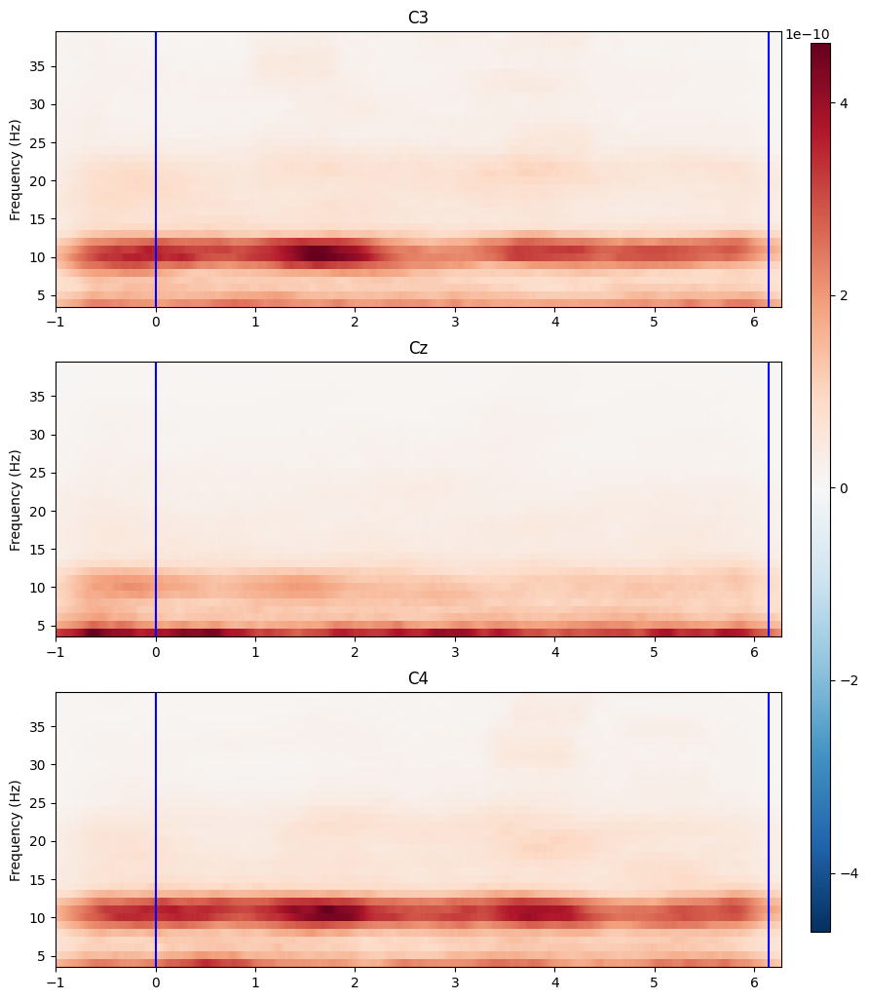

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(10, 12))
sfq = lap_eps.info['sfreq']

picked = ['C3','Cz','C4']
for ch, ax in enumerate(axes.flat[:]):
  left_tfr.average().plot(
            [picked[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked[ch])
  for event in event_line:
    event_pos = event[0] / sfq  # Convert sample position to seconds
    ax.axvline(x=event_pos, color='b')
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

##### Topo

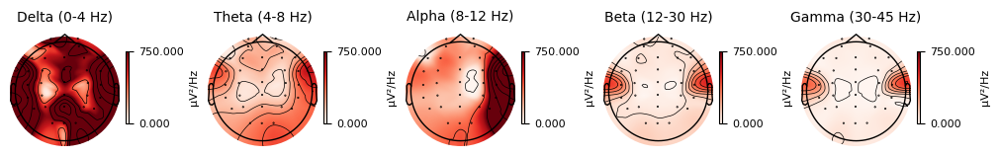

In [ ]:
_ = left_eps.compute_psd().plot_topomap(vlim=(0, 750))

##### Overall

###### Signal

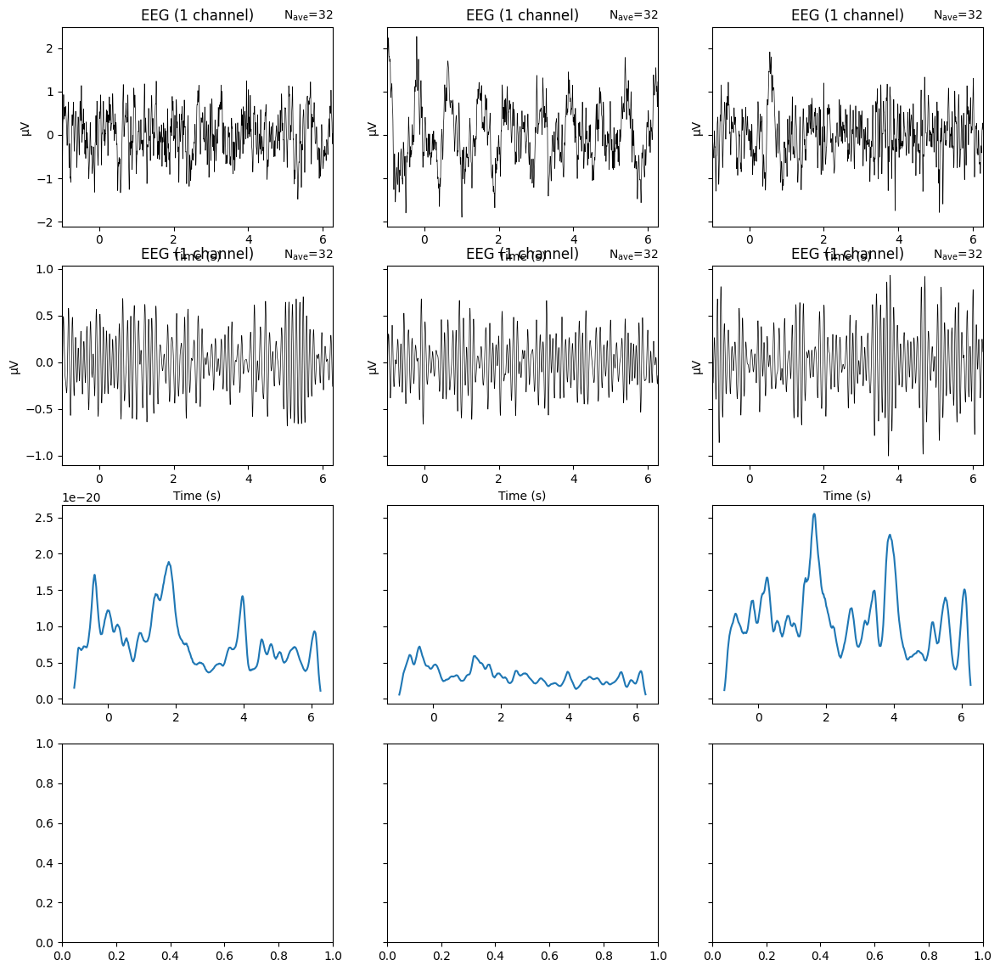

In [ ]:
left_filt_data = feat_analysis(left_eps, left_tfr)

###### MAV (Mean Absolute Value)

In [ ]:
left_mav_data = np.abs(left_filt_data.get_data()).mean(axis=2)

<ipython-input-153-fc7886192837>:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_mav_data = np.abs(left_filt_data.get_data()).mean(axis=2)


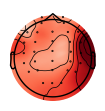

In [ ]:
_ = mne.viz.plot_topomap(left_mav_data.mean(axis=0), lap_eps.info, show=True)

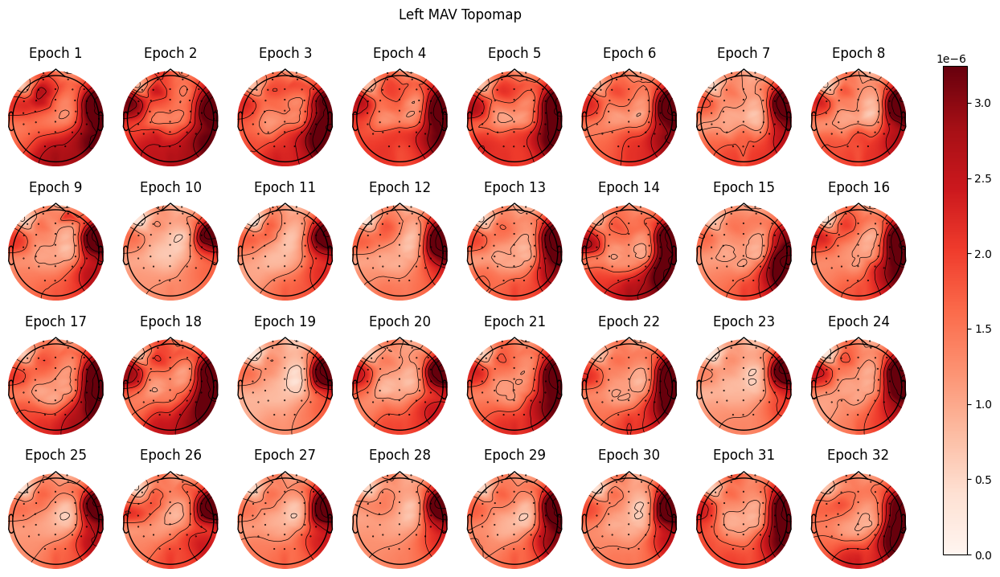

In [ ]:
vert = min((left_mav_data.shape[0] // 8, 4))
plot_multi(left_mav_data, left_eps.info, 8, vert, 'Left MAV Topomap')

#### Right

In [ ]:
right_data = [x.get_data(copy=True) for x  in combined_right]
min_right_len = min([x.shape[-1] for x in right_data])
new_right_data = [a[:,:,:min_right_len] for a in right_data]
right_arr = np.concatenate(new_right_data, axis=0)

In [ ]:
right_eps =  mne.EpochsArray(right_arr, info=combined_right[0].info, tmin=-1, verbose=True)

Not setting metadata
32 matching events found
No baseline correction applied
0 projection items activated


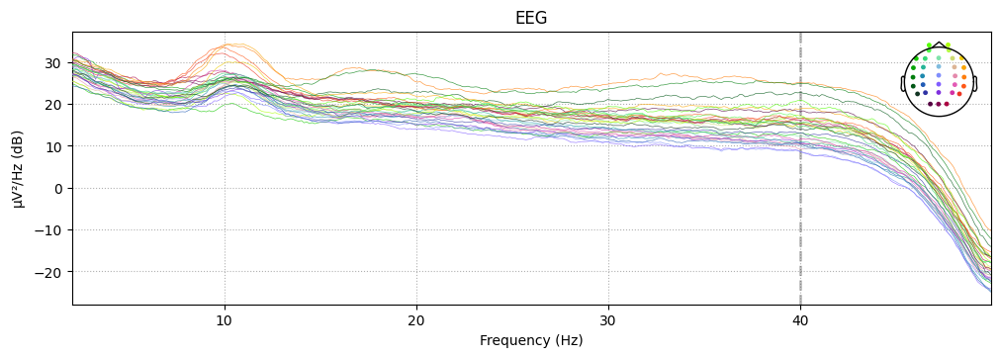

In [ ]:
spectrum_r = right_eps.compute_psd(fmin=2, fmax=50)
_ = spectrum_r.plot()

##### Image

In [ ]:
#_ = left_eps.plot_image(picks=['C3','Cz','C4'])

##### TFR

In [ ]:
freqs = np.arange(4, 40)  # frequencies from 2-35Hz
right_tfr = mne.time_frequency.tfr_multitaper(
    right_eps,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)

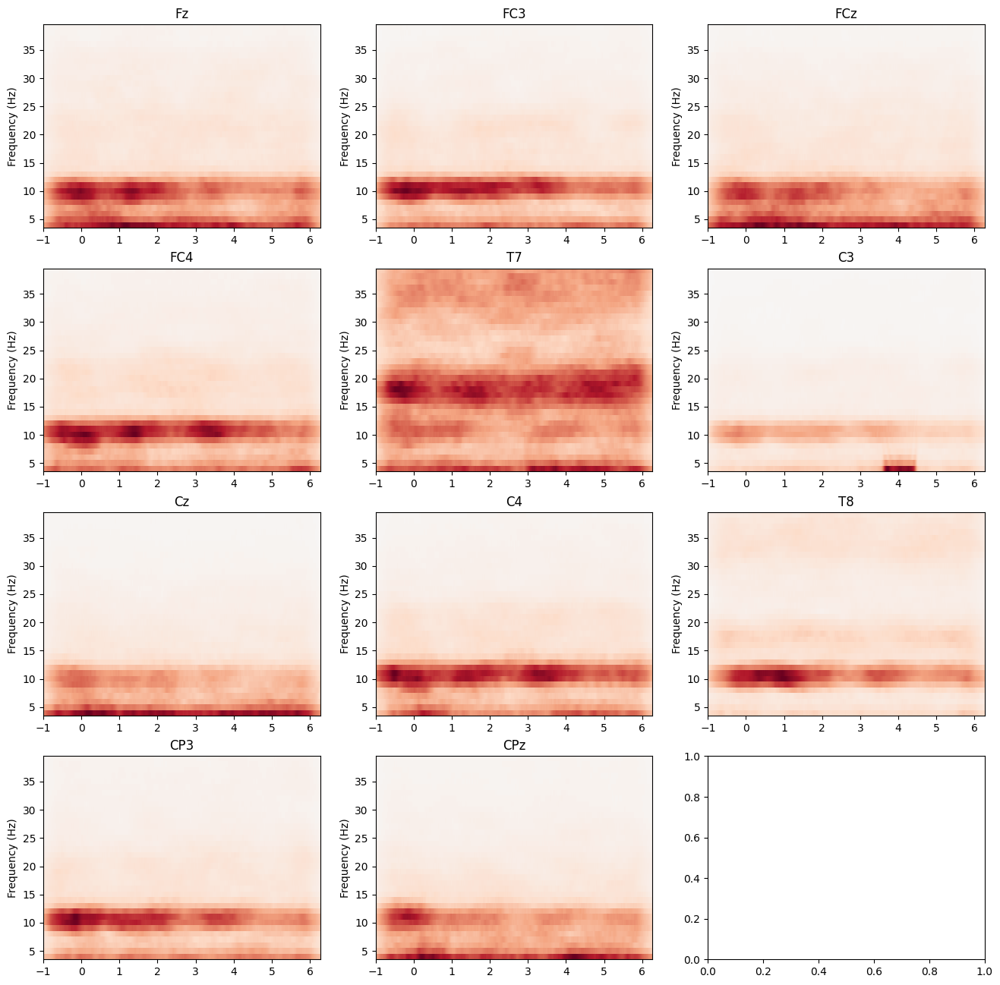

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(16, 16))
sfq = right_eps.info['sfreq']

for ch, ax in enumerate(axes.flat[:-1]):
  right_tfr.average().plot(
            [picked_chn[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked_chn[ch])
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')

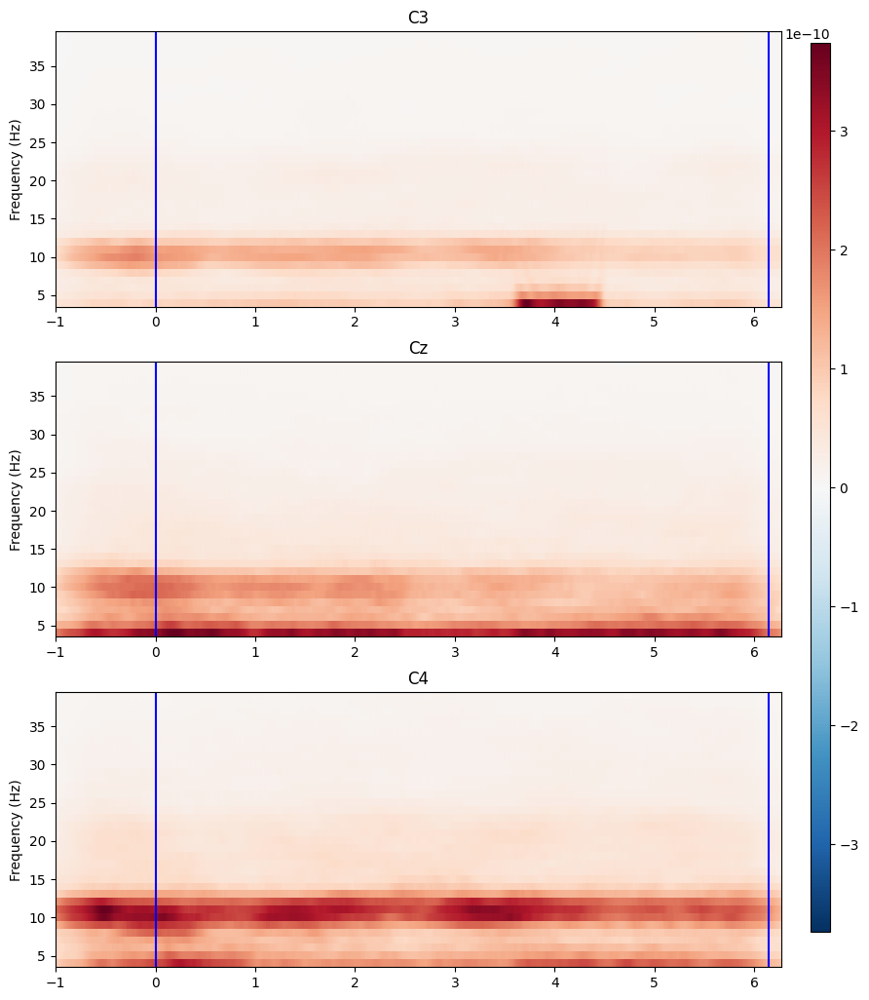

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(10, 12))
sfq = lap_eps.info['sfreq']

picked = ['C3','Cz','C4']
for ch, ax in enumerate(axes.flat[:]):
  right_tfr.average().plot(
            [picked[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked[ch])
  for event in event_line:
    event_pos = event[0] / sfq  # Convert sample position to seconds
    ax.axvline(x=event_pos, color='b')
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

##### Topo

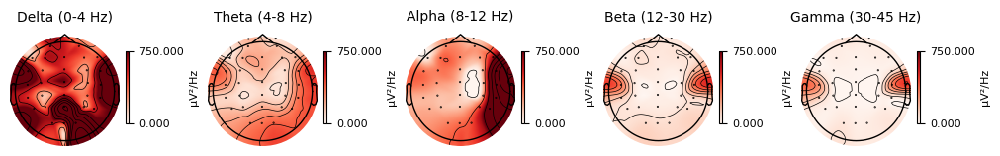

In [ ]:
_ = right_eps.compute_psd().plot_topomap(vlim=(0, 750))

##### Overall

###### Signal

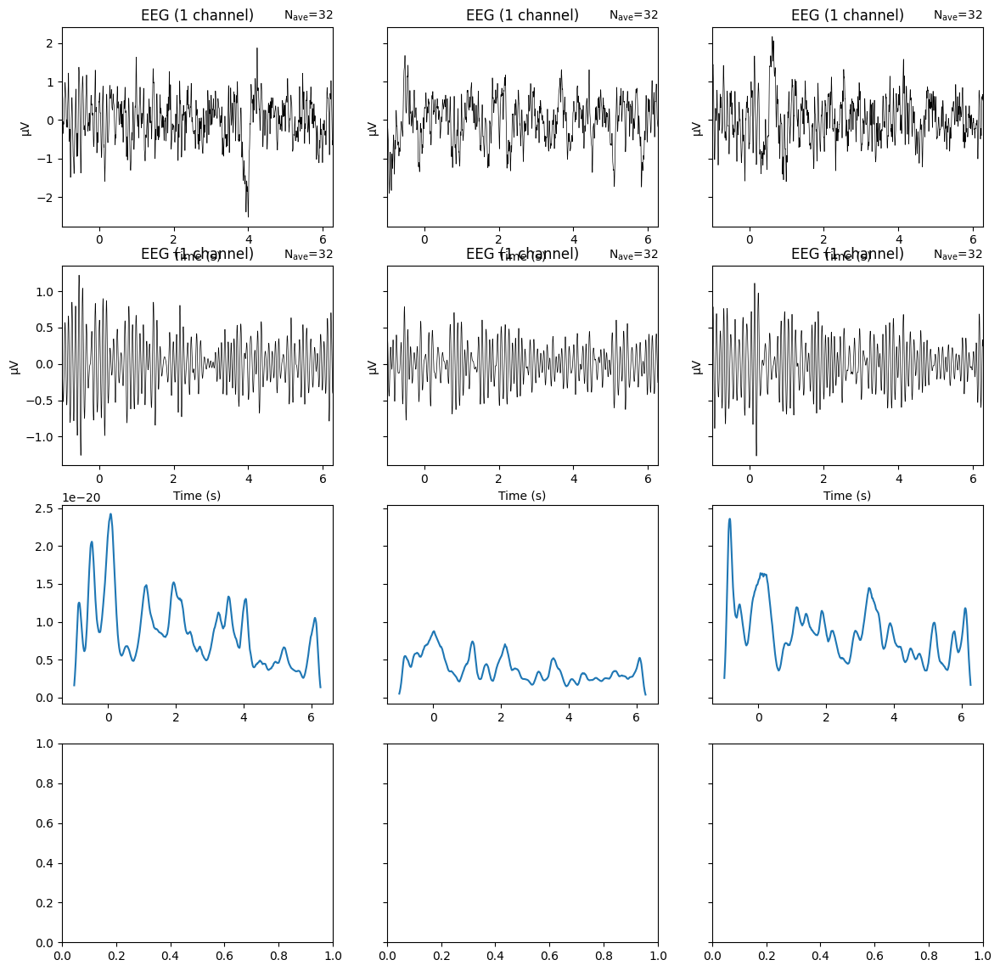

In [ ]:
right_filt_data = feat_analysis(right_eps, right_tfr)

###### MAV (Mean Absolute Value)

In [ ]:
right_mav_data = np.abs(right_filt_data.get_data()).mean(axis=2)

<ipython-input-165-57e940b21218>:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_mav_data = np.abs(right_filt_data.get_data()).mean(axis=2)


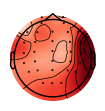

In [ ]:
_ = mne.viz.plot_topomap(right_mav_data.mean(axis=0), lap_eps.info, show=True)

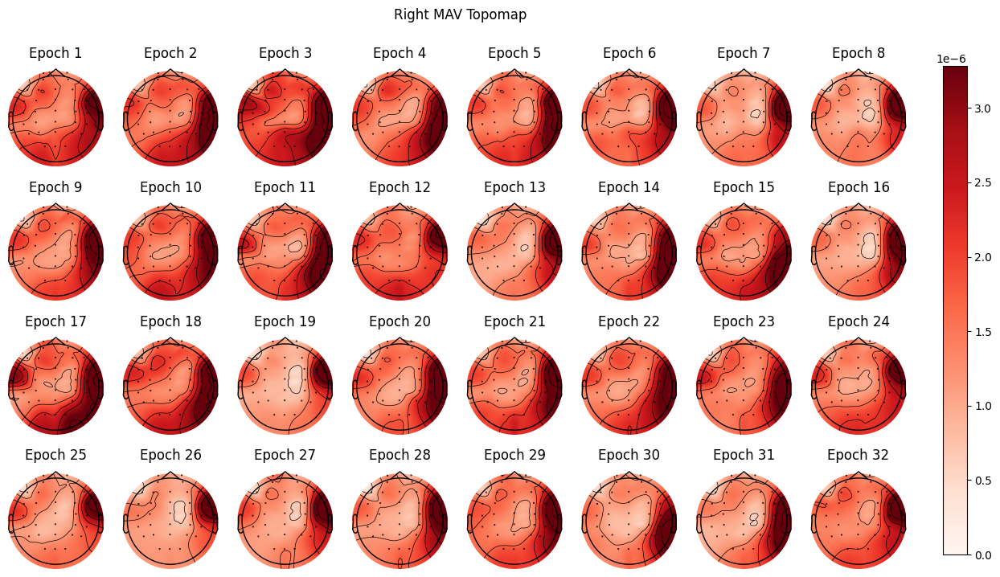

In [ ]:
vert = min((right_mav_data.shape[0] // 8, 4))
plot_multi(right_mav_data, right_eps.info, 8, vert, 'Right MAV Topomap')

#### Foot

In [ ]:
foot_data = [x.get_data(copy=True) for x  in combined_foot]
min_foot_len = min([x.shape[-1] for x in foot_data])
new_foot_data = [a[:,:,:min_foot_len] for a in foot_data]
foot_arr = np.concatenate(new_foot_data, axis=0)

In [ ]:
foot_eps =  mne.EpochsArray(foot_arr, info=combined_foot[0].info, tmin=-1, verbose=True)

Not setting metadata
64 matching events found
No baseline correction applied
0 projection items activated


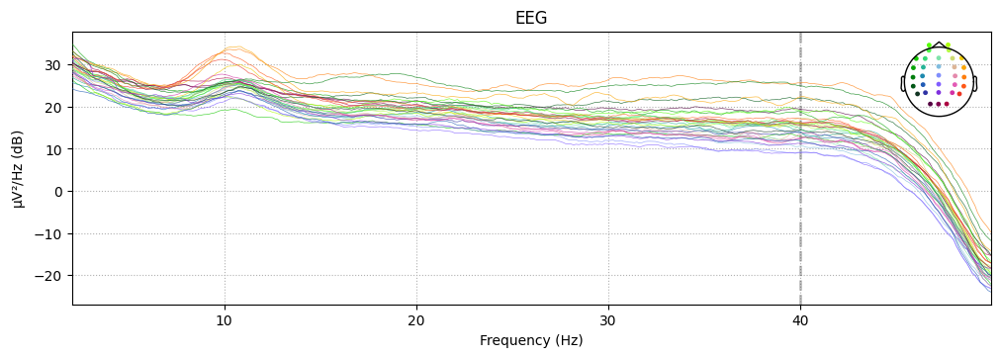

In [ ]:
spectrum_f = foot_eps.compute_psd(fmin=2, fmax=50)
_ = spectrum_f.plot()

##### Image

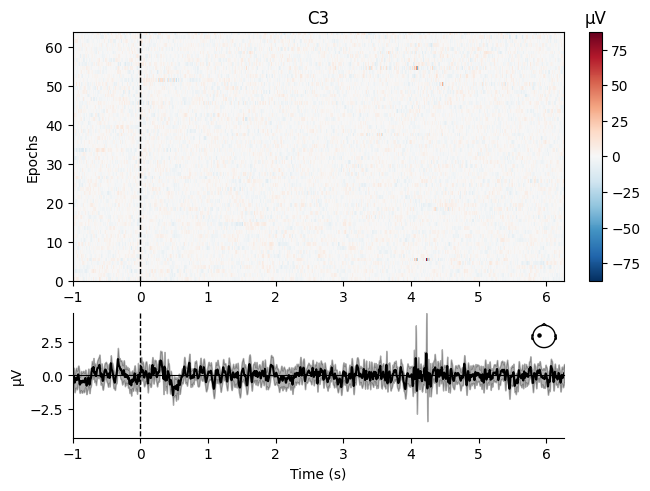

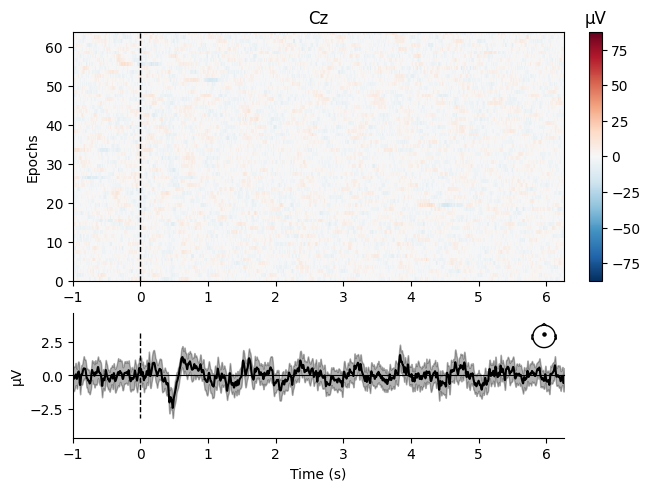

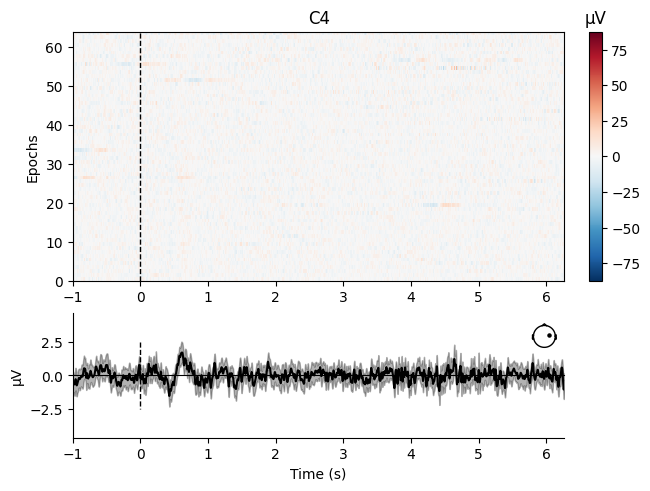

In [ ]:
_ = foot_eps.plot_image(picks=['C3','Cz','C4'])

##### TFR

In [ ]:
freqs = np.arange(4, 40)  # frequencies from 2-35Hz
foot_tfr = mne.time_frequency.tfr_multitaper(
    foot_eps,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)

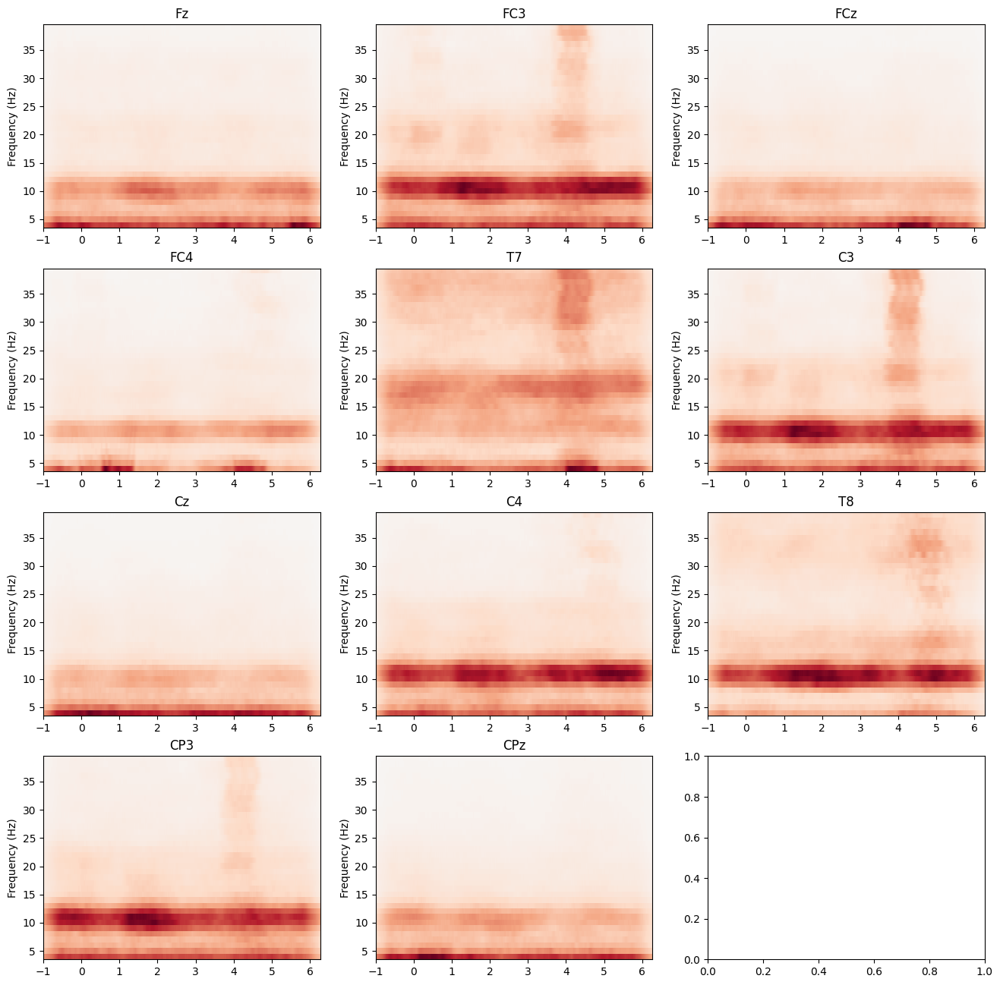

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(16, 16))
sfq = right_eps.info['sfreq']

for ch, ax in enumerate(axes.flat[:-1]):
  foot_tfr.average().plot(
            [picked_chn[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked_chn[ch])
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')

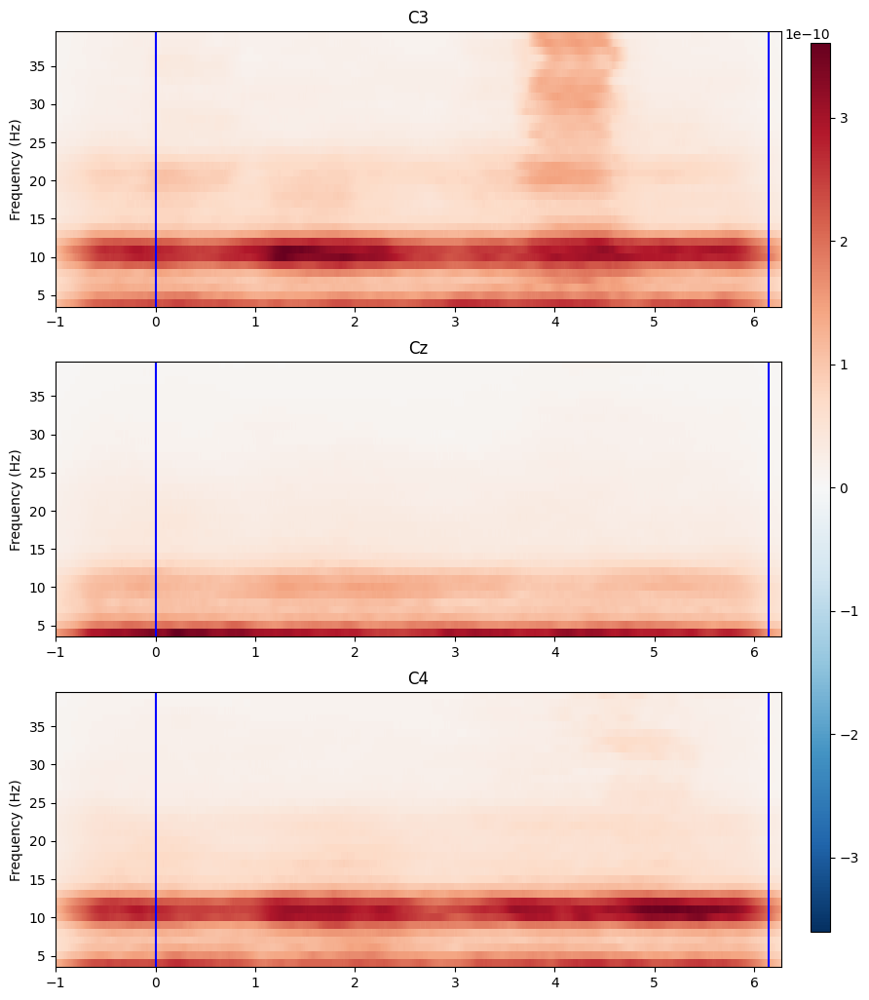

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(10, 12))
sfq = lap_eps.info['sfreq']

picked = ['C3','Cz','C4']
for ch, ax in enumerate(axes.flat[:]):
  foot_tfr.average().plot(
            [picked[ch]],
            axes=ax,
            colorbar=False,
            show=False
        )
  ax.set_title(picked[ch])
  for event in event_line:
    event_pos = event[0] / sfq  # Convert sample position to seconds
    ax.axvline(x=event_pos, color='b')
  if (ch != len(picked_chn)-1):
    ax.set_xlabel('')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

##### Topo

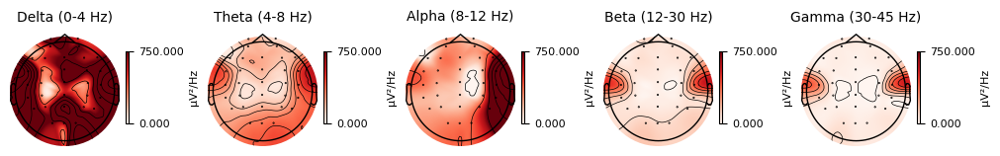

In [ ]:
_ = foot_eps.compute_psd().plot_topomap(vlim=(0, 750))

##### Overall

###### Signal

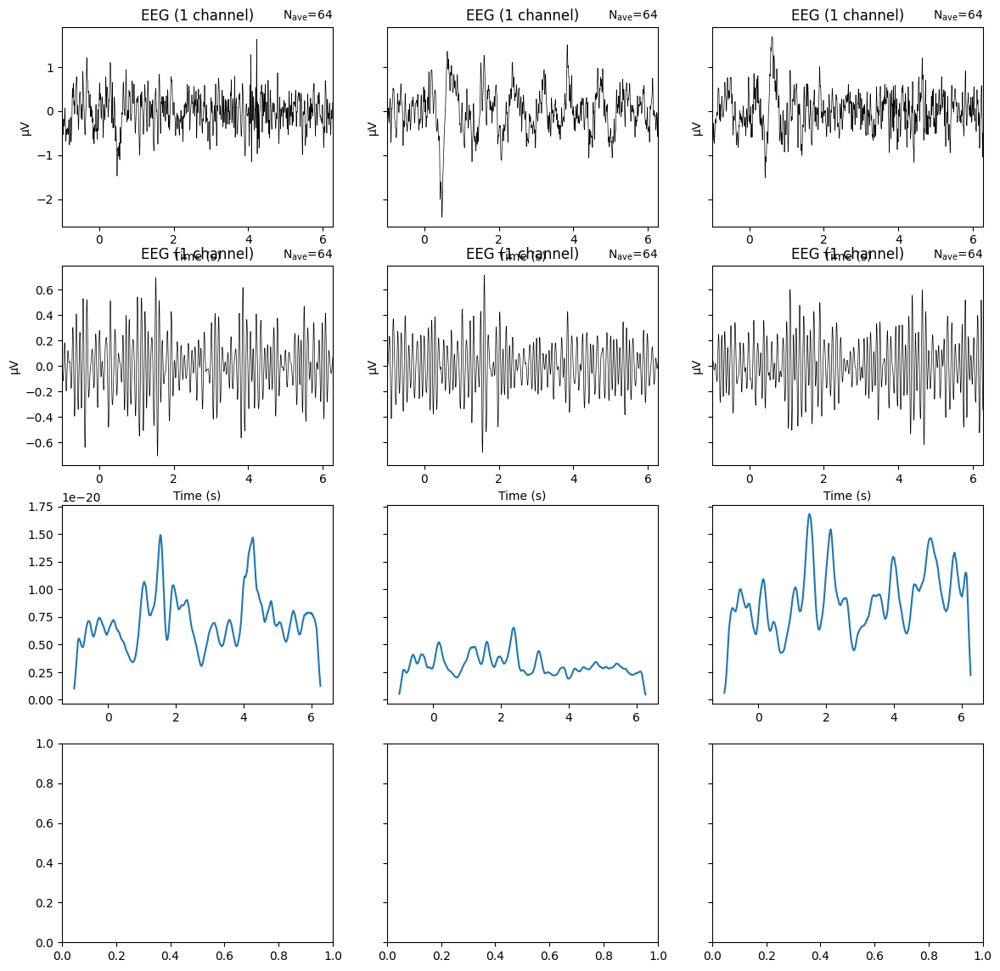

In [ ]:
foot_filt_data = feat_analysis(foot_eps, foot_tfr)

###### MAV (Mean Absolute Value)

In [ ]:
foot_mav_data = np.abs(foot_filt_data.get_data()).mean(axis=2)

<ipython-input-177-e068e9d56d77>:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  foot_mav_data = np.abs(foot_filt_data.get_data()).mean(axis=2)


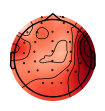

In [ ]:
_ = mne.viz.plot_topomap(foot_mav_data.mean(axis=0), lap_eps.info, show=True)

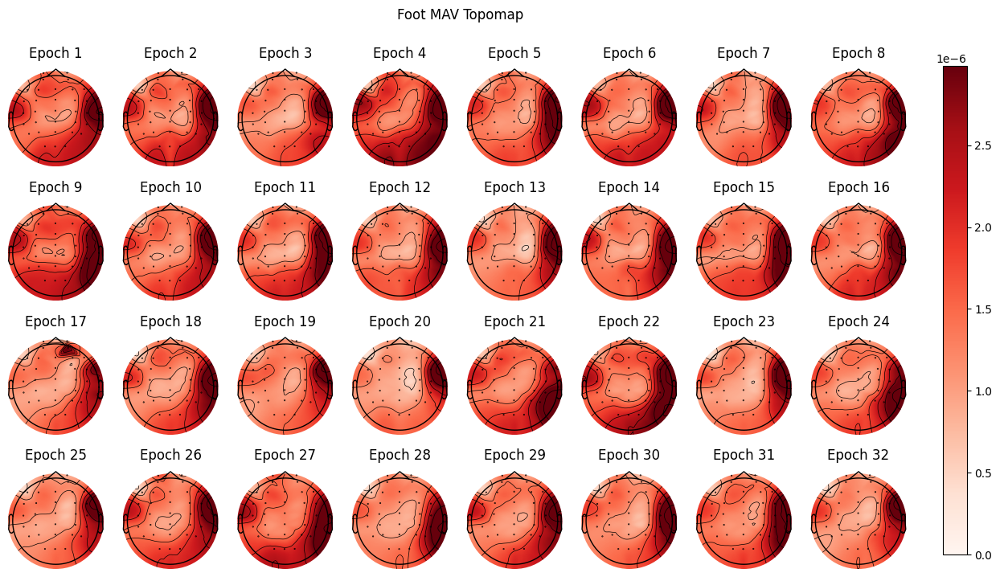

In [ ]:
vert = min((foot_mav_data.shape[0] // 8, 4))
plot_multi(foot_mav_data, foot_eps.info, 8, vert, 'Foot MAV Topomap')

In [ ]:
gc.collect()

109018

## Analysis

### MAV

In [ ]:
base_mav = base_mav_data.mean(axis=0)

In [ ]:
lap_log_ratio = np.log(lap_mav_data / base_mav)

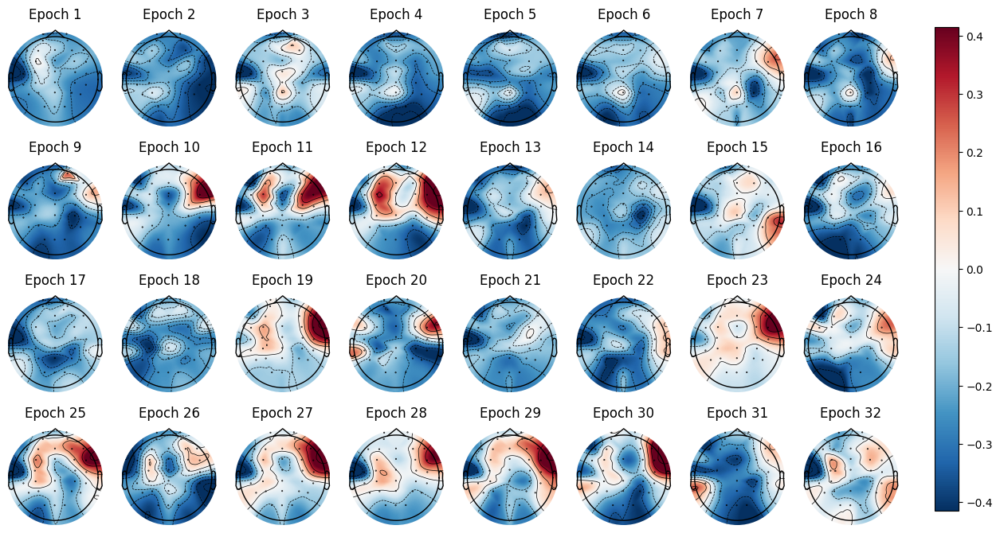

In [ ]:
left_log_ratio = np.log(left_mav_data / base_mav)
vert = min((left_mav_data.shape[0] // 8, 4))
fig, axes = plt.subplots(vert, 8, figsize=(15, 8))
for ep_id, ax in enumerate(axes.flat[:]):
  mne.viz.plot_topomap(left_log_ratio[ep_id], left_eps.info, axes=ax, show=False)
  ax.set_title(f'Epoch {ep_id + 1}')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

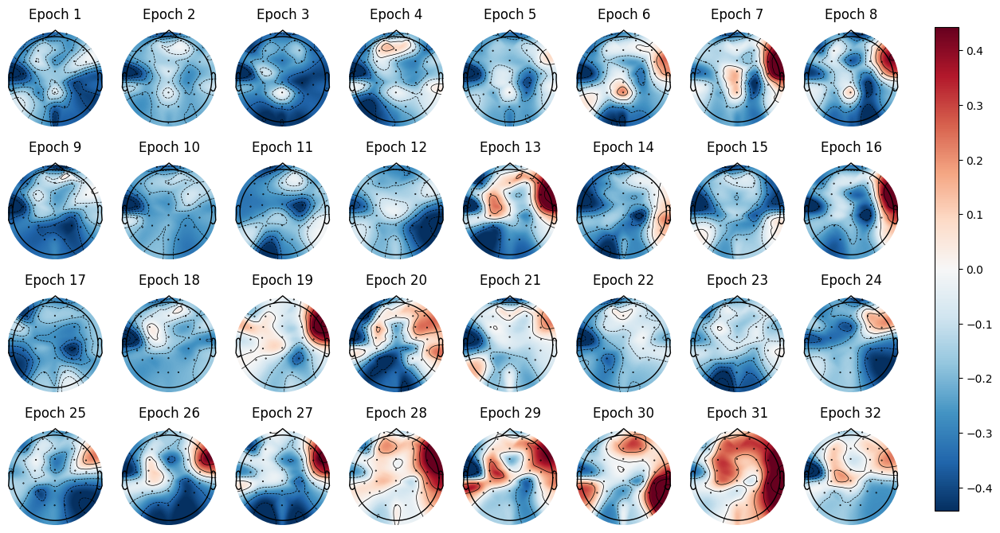

In [ ]:
right_log_ratio = np.log(right_mav_data / base_mav)
vert = min((right_mav_data.shape[0] // 8, 4))
fig, axes = plt.subplots(vert, 8, figsize=(15, 8))
for ep_id, ax in enumerate(axes.flat[:]):
  mne.viz.plot_topomap(right_log_ratio[ep_id], left_eps.info, axes=ax, show=False)
  ax.set_title(f'Epoch {ep_id + 1}')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

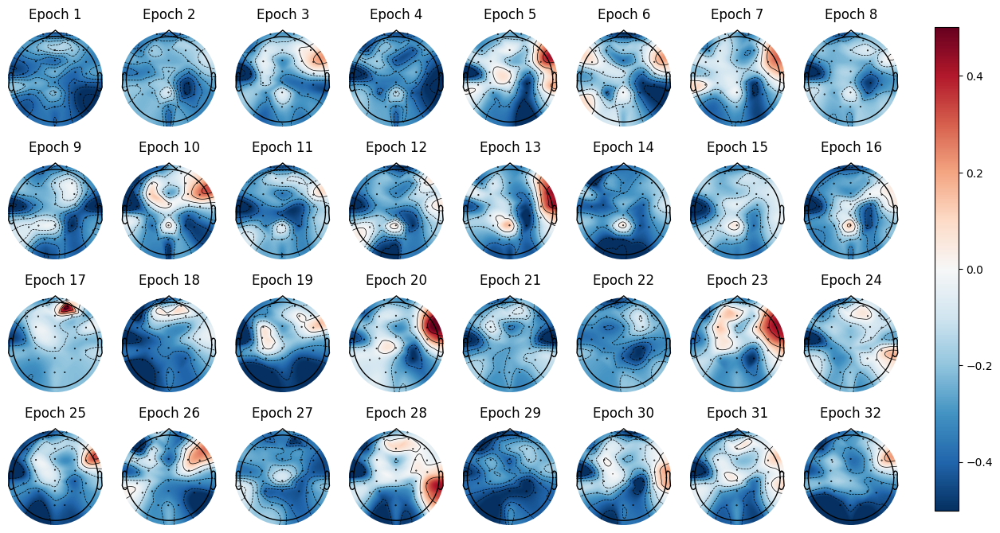

In [ ]:
foot_log_ratio = np.log(foot_mav_data / base_mav)
vert = min((foot_mav_data.shape[0] // 8, 4))
fig, axes = plt.subplots(vert, 8, figsize=(15, 8))
for ep_id, ax in enumerate(axes.flat[:]):
  mne.viz.plot_topomap(foot_log_ratio[ep_id], left_eps.info, axes=ax, show=False)
  ax.set_title(f'Epoch {ep_id + 1}')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axes.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

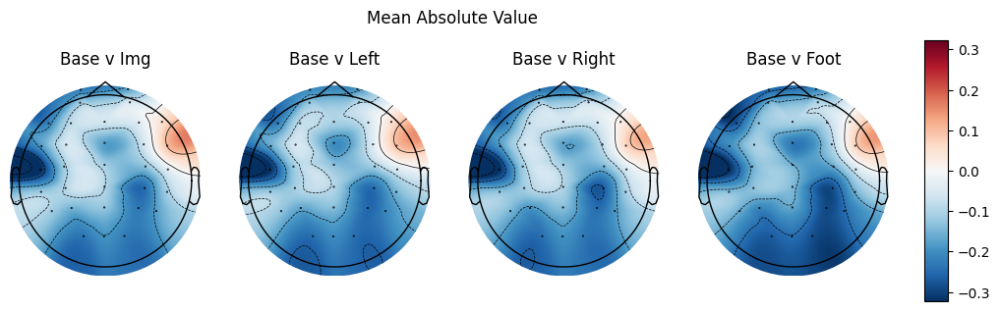

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3.5))
fig.suptitle('Mean Absolute Value')
_ = mne.viz.plot_topomap(lap_log_ratio.mean(axis=0), lap_eps.info, axes=axs.flat[0], show=False)
axs.flat[0].set_title(f'Base v Img')
_ = mne.viz.plot_topomap(left_log_ratio.mean(axis=0), lap_eps.info, axes=axs.flat[1], show=False)
axs.flat[1].set_title(f'Base v Left')
_ = mne.viz.plot_topomap(right_log_ratio.mean(axis=0), lap_eps.info, axes=axs.flat[2], show=False)
axs.flat[2].set_title(f'Base v Right')
_ = mne.viz.plot_topomap(foot_log_ratio.mean(axis=0), lap_eps.info, axes=axs.flat[3], show=False)
axs.flat[3].set_title(f'Base v Foot')
fig.subplots_adjust(bottom=0.1, right=0.87, top=0.9)
cax = plt.axes((0.9, 0.13, 0.02, 0.76))
fig.colorbar(axs.flat[-1].images[-1], cax=cax).ax.set_yscale("linear")

### Topo Power

Text(0.5, 1.0, 'Foot')

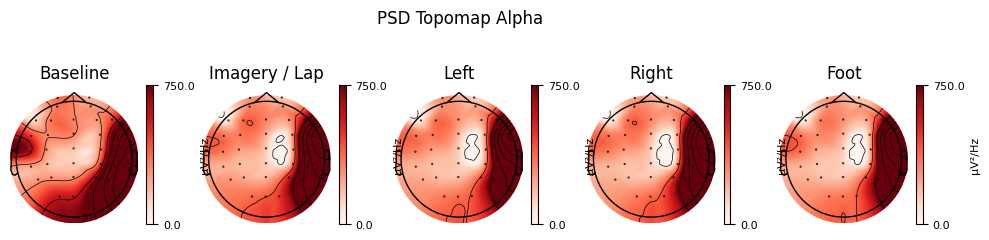

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(12, 3))
fig.suptitle('PSD Topomap Alpha')
_ = base_filt_data.compute_psd().plot_topomap(bands={'Alpha (8-12 Hz)': (8,12)}, axes=axs.flat[0], vlim=(0, 750), cbar_fmt='%0.1f', show=False)
axs.flat[0].set_title(f'Baseline')
_ = lap_filt_data.compute_psd().plot_topomap(bands={'Alpha (8-12 Hz)': (8,12)}, axes=axs.flat[1], vlim=(0, 750), cbar_fmt='%0.1f', show=False)
axs.flat[1].set_title(f'Imagery / Lap')
_ = left_filt_data.compute_psd().plot_topomap(bands={'Alpha (8-12 Hz)': (8,12)}, axes=axs.flat[2], vlim=(0, 750), cbar_fmt='%0.1f', show=False)
axs.flat[2].set_title(f'Left')
_ = right_filt_data.compute_psd().plot_topomap(bands={'Alpha (8-12 Hz)': (8,12)}, axes=axs.flat[3], vlim=(0, 750), cbar_fmt='%0.1f', show=False)
axs.flat[3].set_title(f'Right')
_ = foot_filt_data.compute_psd().plot_topomap(bands={'Alpha (8-12 Hz)': (8,12)}, axes=axs.flat[4], vlim=(0, 750), cbar_fmt='%0.1f', show=False)
axs.flat[4].set_title(f'Foot')

### CSP

#### Data

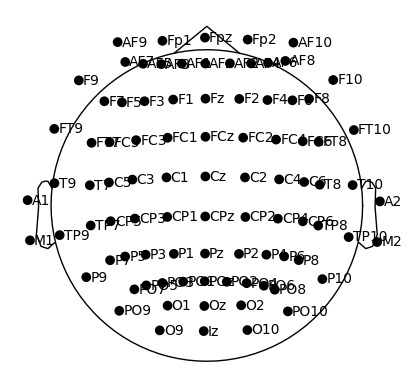

In [ ]:
# Create a standard montage (e.g., 10-20 system)
montage = mne.channels.make_standard_montage('standard_1020')

# Plot the montage to visualize the electrode positions
fig, ax = plt.subplots(figsize=(5, 5))
_ = montage.plot(show_names=True, axes=ax)

In [ ]:
#ch_list = ['Fp1', 'Fp2', 'AF3', 'AF4', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz','FC4', 'FT8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2']
used_chn = ['C3','Cz','C4','FC3','FCz','FC4','CP3','CPz','CP4','FT7','T7','TP7','FT8','T8','TP8', 'F3', 'Fz', 'F4', 'P3', 'Pz', 'P4']
#used_chn = ['C3','Cz','C4','FC3','FCz','FC4','CP3','CPz','CP4','FT7','T7','TP7','FT8','T8','TP8']

In [ ]:
all_epochs = [left_filt_data, right_filt_data, foot_filt_data]
ep_data = []
lbl_data = []
for i, eps in enumerate(all_epochs):
  epochs_train = eps.copy().crop(tmin=0.0, tmax=4.0).pick_channels(used_chn, ordered=True)
  lbl_arr = eps.events[:,-1]
  lbl_arr[:] = i
  ep_data.append(epochs_train.get_data(copy=True))
  #ep_data.append(epochs_train)
  lbl_data.append(lbl_arr)

In [ ]:
train_data = np.concatenate(ep_data)
lbls = np.concatenate(lbl_data)

#### Classifier

In [ ]:
lda = LinearDiscriminantAnalysis()
svc = SVC(gamma='auto')
csp = CSP(n_components=4, reg=None, log=False, norm_trace=False)
scaler = Scaler(scalings='mean')

clf = Pipeline([("CSP", csp), ("LDA", lda)])
clf2 = Pipeline([("CSP", csp), ("SVC", svc)])

In [ ]:
#clf = Pipeline([("Scaler", scaler), ("CSP", csp), ("LDA", lda)])
#clf2 = Pipeline([("Scaler", scaler), ("CSP", csp), ("SVC", svc)])

In [ ]:
cv = ShuffleSplit(10, test_size=0.2, random_state=42)
cv_split = cv.split(train_data)

In [ ]:
scores = cross_val_score(clf, train_data, lbls, cv=cv, n_jobs=None)

In [ ]:
# Printing the results
class_balance = np.mean(lbls == lbls[0])
class_balance = max(class_balance, 1.0 - class_balance)
print(scores)
print(
    "Classification accuracy: %f / Chance level: %f" % (np.mean(scores), class_balance)
)

[0.5        0.42307692 0.61538462 0.57692308 0.42307692 0.46153846
 0.5        0.57692308 0.65384615 0.53846154]
Classification accuracy: 0.526923 / Chance level: 0.750000


In [ ]:
scores2 = cross_val_score(clf2, train_data, lbls, cv=cv, n_jobs=None)

In [ ]:
# Printing the results
print(scores2)
print(
    "Classification accuracy: %f / Chance level: %f" % (np.mean(scores2), class_balance)
)

[0.5        0.38461538 0.61538462 0.46153846 0.38461538 0.5
 0.5        0.42307692 0.57692308 0.5       ]
Classification accuracy: 0.484615 / Chance level: 0.750000


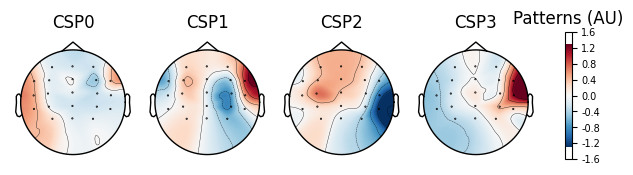

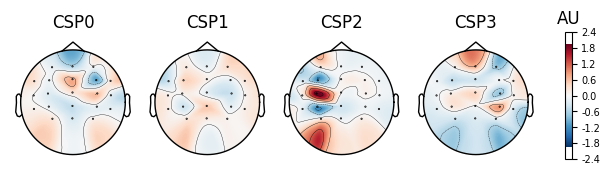

In [ ]:
csp.fit_transform(train_data, lbls)

_ = csp.plot_patterns(epochs_train.info, ch_type="eeg", units="Patterns (AU)")
_ = csp.plot_filters(epochs_train.info, scalings=1e-6)

## Clear

In [ ]:
gc.collect()

113139